In [1]:
import scanpy as sc
sc.settings.verbosity = 2

import pandas as pd

import tqdm.notebook

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 

import torch
import pyro


In [2]:
from load_data import load_datasets
from decipher_model import DecipherConfig
from decipher_training import train_simple


In [28]:
datasets = load_datasets(
    min_cells=50,
    min_counts=150,
    subsample={"p89": 12000, "healthy": 6000},
    seed=0,
    target_sum=10_000,
    datasets_to_load=["p89", "healthy"]
)

adata = datasets['p89_healthy']
adata = adata[adata.obs["cell_type_merged"] != "lympho"]


filtered out 6823 genes that are detected in less than 50 cells
filtered out 1529 genes that are detected in less than 150 counts
p89 PREPROCESSED: OK
filtered out 6114 genes that are detected in less than 50 cells
filtered out 1650 genes that are detected in less than 150 counts
healthy PREPROCESSED: OK
align gene names
Removing genes starting with RPL*, RPS*, MT-*
Subsampling datasets to:  p89 = 12000 cells, healthy = 6000 cells
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
Build combined datasets with healthy


In [29]:
config = DecipherConfig(
    latent_dim=10,
    pre_latent_dim=2,
    z_to_x_layers=[],
    seed=0,
    beta=1e-1
)

V4
[Epoch 0000]  Loss: 125177764.88796


... storing 'NPM1_mut' as categorical
... storing 'NPM1_wt' as categorical
... storing 'cell_type' as categorical
... storing 'low_count_cluster' as categorical
... storing 'origin' as categorical
... storing 'cell_type_merged' as categorical
... storing 'DNMT3A_mut' as categorical
... storing 'DNMT3A_wt' as categorical


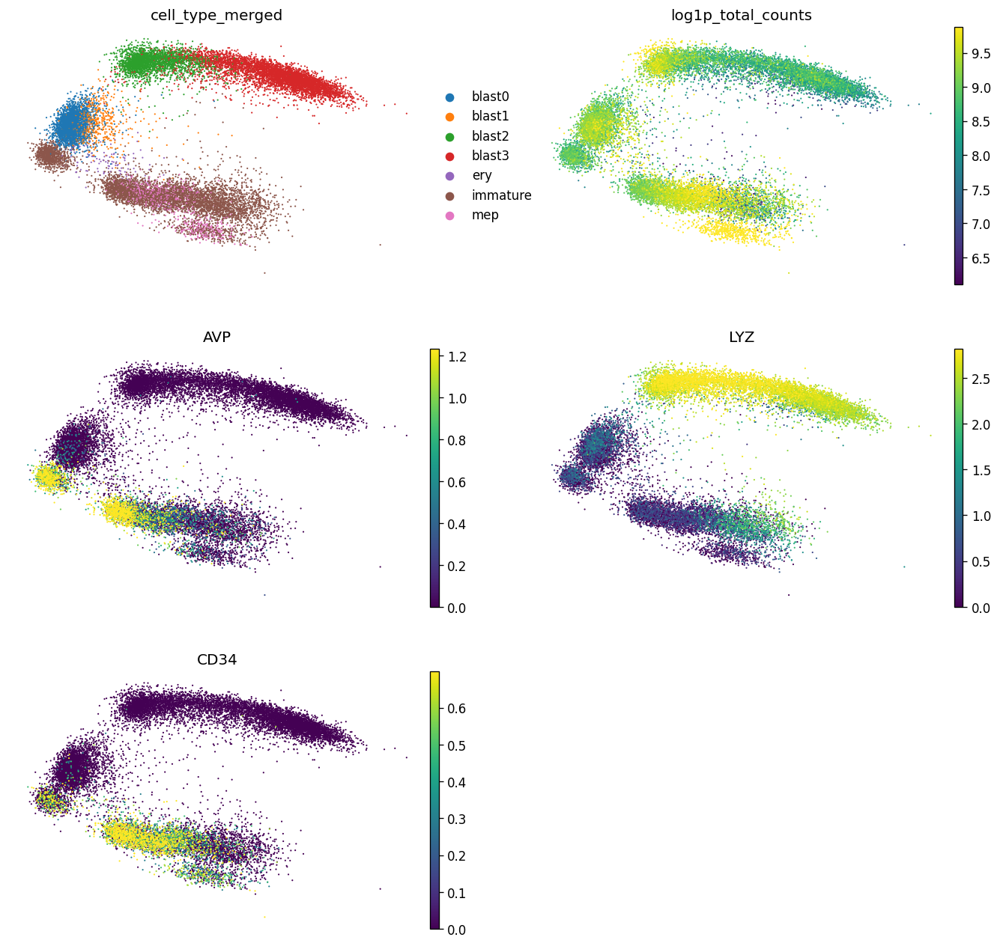

[Epoch 0001]  Loss: 114453732.41823
[Epoch 0002]  Loss: 113167223.07555
[Epoch 0003]  Loss: 112681059.42813
[Epoch 0004]  Loss: 112438312.26848
[Epoch 0005]  Loss: 112289835.91258


... storing 'NPM1_mut' as categorical
... storing 'NPM1_wt' as categorical
... storing 'cell_type' as categorical
... storing 'low_count_cluster' as categorical
... storing 'origin' as categorical
... storing 'cell_type_merged' as categorical
... storing 'DNMT3A_mut' as categorical
... storing 'DNMT3A_wt' as categorical


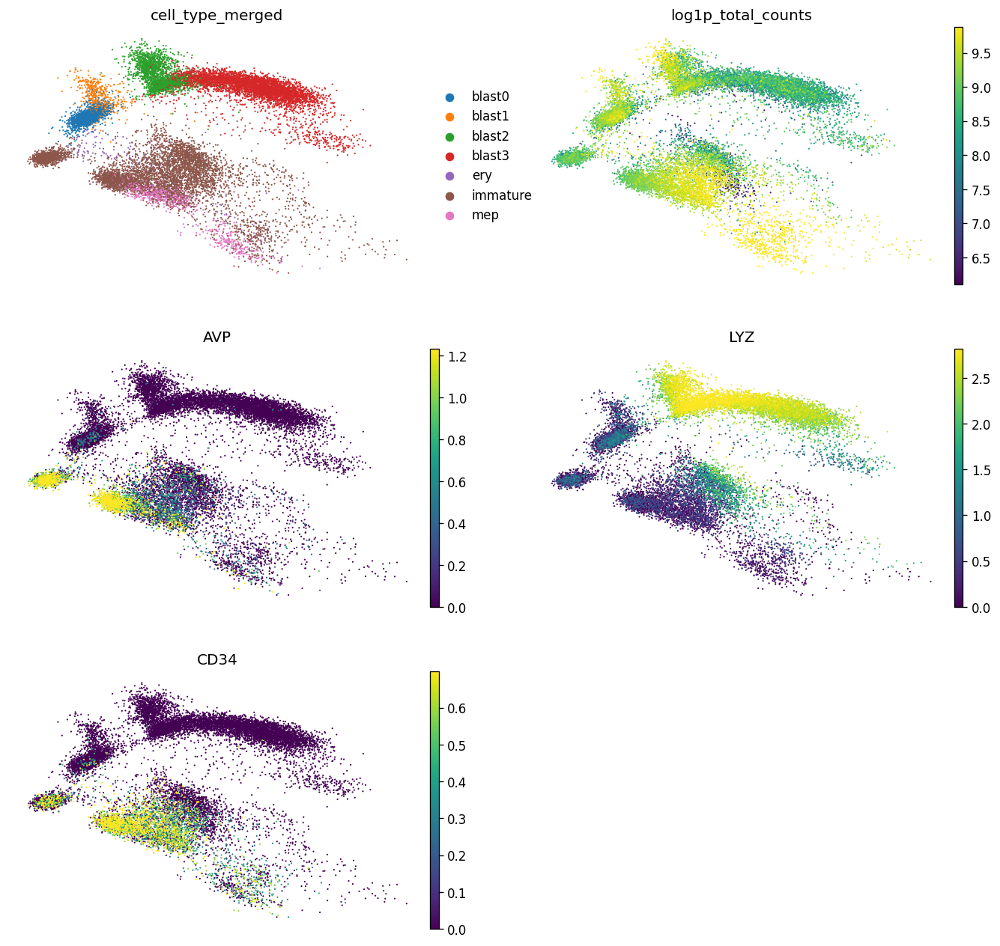

[Epoch 0006]  Loss: 112176800.95121
[Epoch 0007]  Loss: 112106184.19619
[Epoch 0008]  Loss: 112054458.13352
[Epoch 0009]  Loss: 112012998.30841
[Epoch 0010]  Loss: 111988002.18551


... storing 'NPM1_mut' as categorical
... storing 'NPM1_wt' as categorical
... storing 'cell_type' as categorical
... storing 'low_count_cluster' as categorical
... storing 'origin' as categorical
... storing 'cell_type_merged' as categorical
... storing 'DNMT3A_mut' as categorical
... storing 'DNMT3A_wt' as categorical


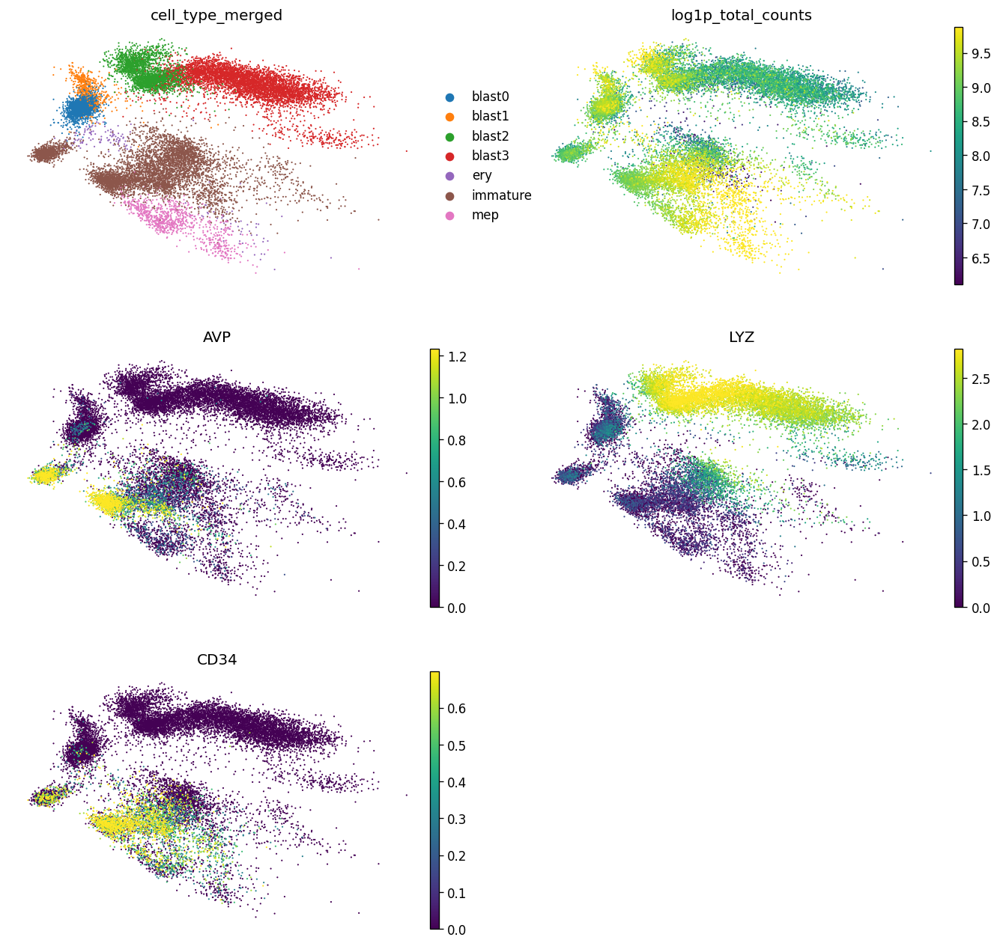

[Epoch 0011]  Loss: 111964909.80070
[Epoch 0012]  Loss: 111946268.98534
[Epoch 0013]  Loss: 111933617.96759
[Epoch 0014]  Loss: 111916121.71354
[Epoch 0015]  Loss: 111907009.61187


... storing 'NPM1_mut' as categorical
... storing 'NPM1_wt' as categorical
... storing 'cell_type' as categorical
... storing 'low_count_cluster' as categorical
... storing 'origin' as categorical
... storing 'cell_type_merged' as categorical
... storing 'DNMT3A_mut' as categorical
... storing 'DNMT3A_wt' as categorical


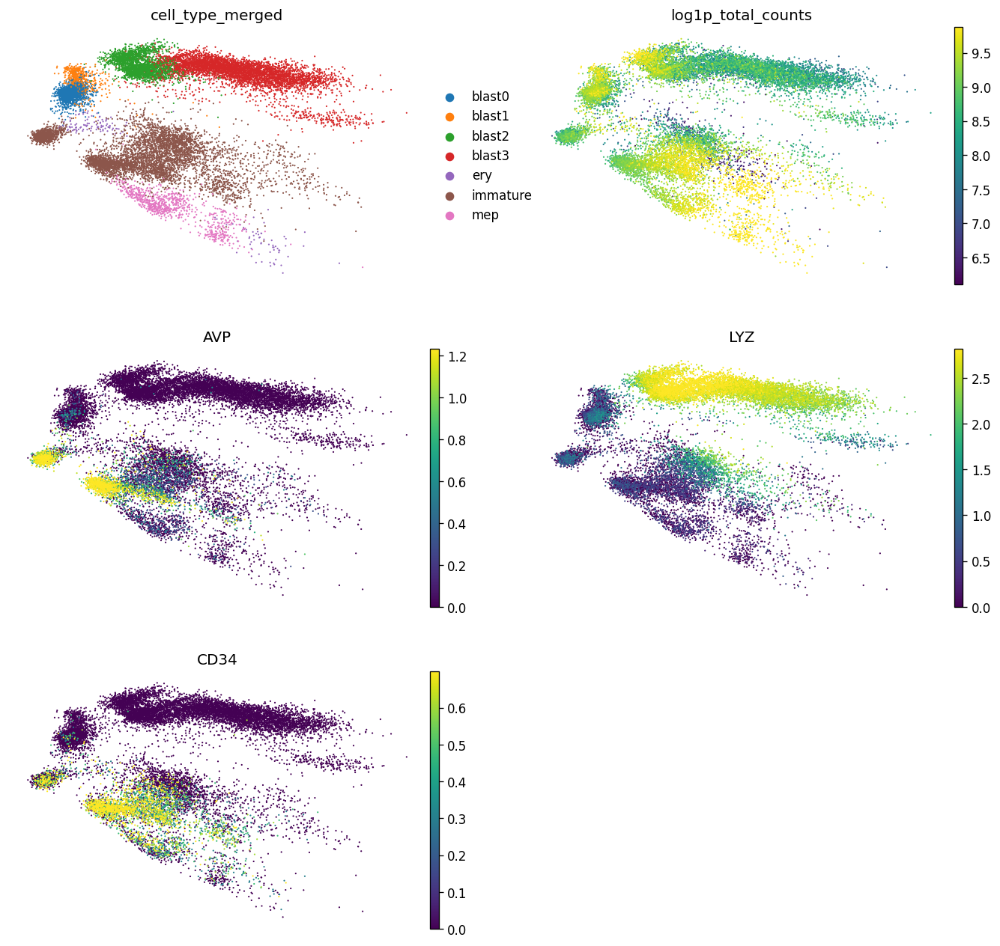

In [30]:
model, adata = train_simple(
    adata,
    config,
    learning_rate=1e-2,
    n_epochs=16,
    plot_every_k_epoch=5,
    plot_kwargs=dict(
        color=["cell_type_merged", "log1p_total_counts", "AVP", "LYZ", "CD34"],
        vmax=lambda xs: np.quantile(xs, 0.95),
        ncols=2,
    ),
)

In [32]:
model.reconstruct_from_prelatent_numpy

## Gastric cancer data

In [10]:
import os 
from scipy.sparse import csr_matrix

adatas = []

# load counts
for file_path in os.listdir("data/gastric/GSE150290_RAW/"):
    if "txt.gz" in file_path:
        adata = sc.read_text("data/gastric/GSE150290_RAW/" + file_path).T
        adata.X = csr_matrix(adata.X)
        adata.obs['origin'] = file_path.split("_")[1].split(".txt")[0]
        adatas.append(adata)
full_adata = sc.concat(adatas)

# load annotations
annotations_old = pd.read_csv("data/gastric/total_cells_trajectory.txt", sep="\t")
annotations_old["Barcode"] = ("Pat" + annotations_old["Barcode"].str[1:3] + "-" + annotations_old["Barcode"].str[3:])
annotations_old.set_index("Barcode", inplace=True)

annotations = pd.read_csv("data/gastric/total_cells_trajectory_annotation.txt", sep="\t")
annotations["Barcode"] = ("Pat" + annotations["Barcode"].str[1:3] + "-" + annotations["Barcode"].str[3:])
annotations.set_index("Barcode", inplace=True)

full_adata = full_adata[annotations_old.index].copy()
for k in ["type", "type2", "class", "cellType"]:
    full_adata.obs[k] = annotations[k]

adata = full_adata


In [11]:
adata.obs["class_I"] = adata.obs["class"]
adata.obs.loc[adata.obs["class"].str[0] == "D", "class_I"] = None

adata.obs["class_D"] = adata.obs["class"]
adata.obs.loc[adata.obs["class"].str[0] == "I", "class_D"] = None

adata.obs["n_counts"] = np.array((adata.X.sum(axis=1) + 1))[:, 0]
adata.obs["n_counts_log10"] = np.array(np.log10(adata.X.sum(axis=1) + 1))[:, 0]


adata = adata[~((adata.obs["cellType"] == "dropped"))]

for k in ["type", "type2", "class", "class_I", "class_D", "origin", "cellType"]:
    adata.obs[k] = pd.Categorical(adata.obs[k])

In [16]:
adata.obs["class_I_number"] = adata.obs["class_I"].replace({"Enteroendo": None}).str[1].astype(float)
adata.obs["class_D_number"] = adata.obs["class_D"].replace({"Enteroendo": None}).str[1].astype(float)


V4
[Epoch 0000]  Loss: 83931647.66716


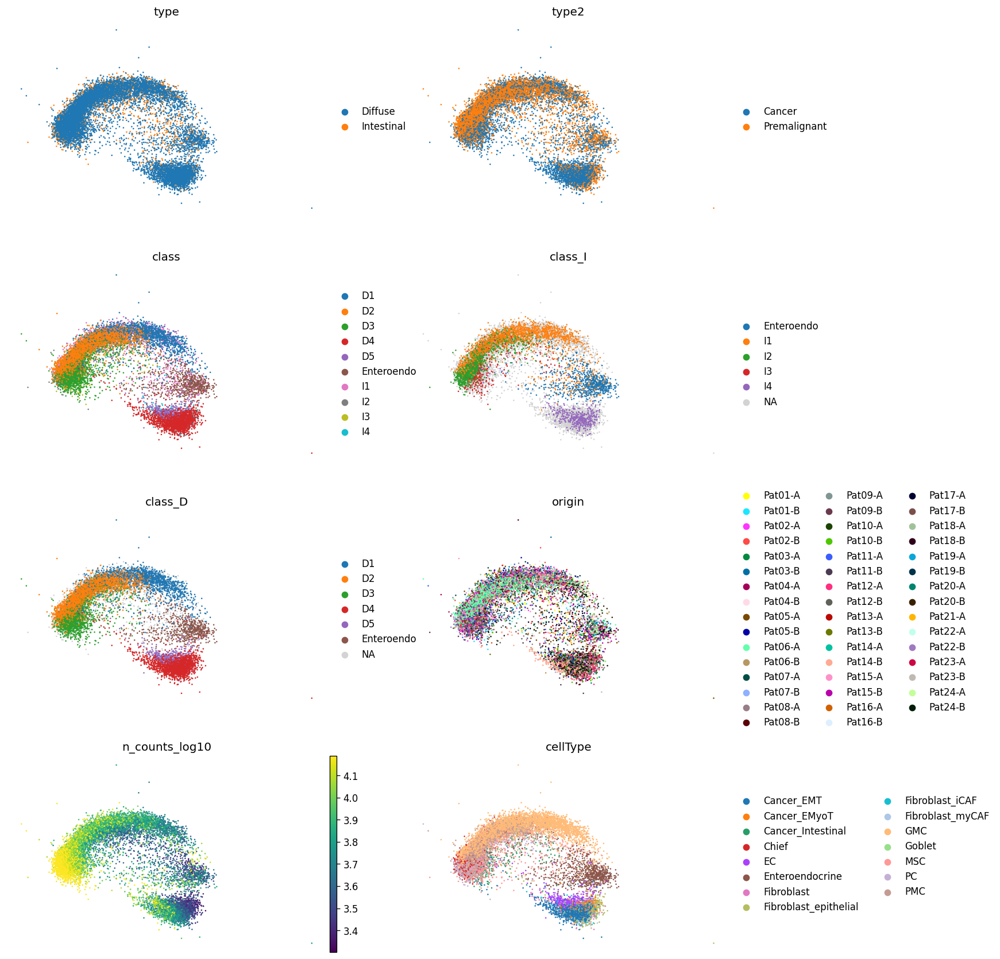

[Epoch 0001]  Loss: 69465903.65110
[Epoch 0002]  Loss: 67190392.17305
[Epoch 0003]  Loss: 66512718.84711
[Epoch 0004]  Loss: 66063351.22338
[Epoch 0005]  Loss: 65693280.03432


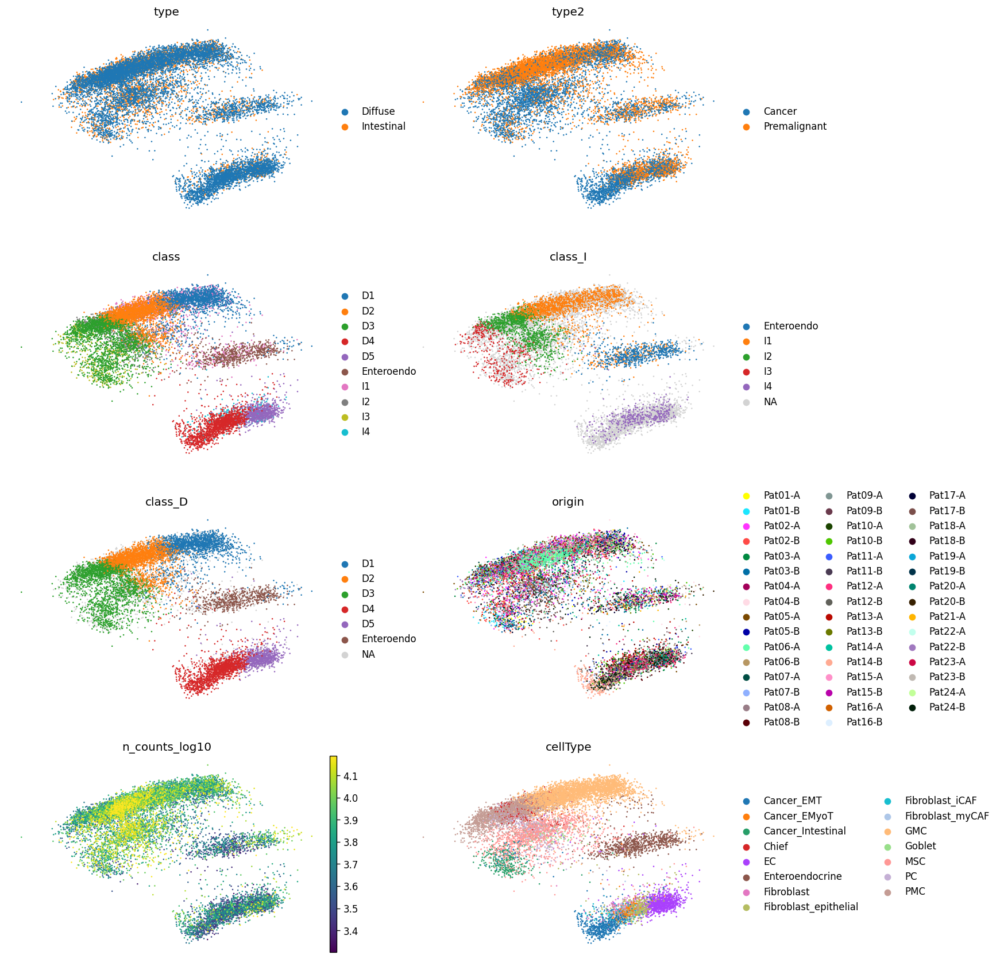

[Epoch 0006]  Loss: 65430962.54757
[Epoch 0007]  Loss: 65394836.48643
[Epoch 0008]  Loss: 65035968.03447
[Epoch 0009]  Loss: 64868400.07009
[Epoch 0010]  Loss: 64741821.32905


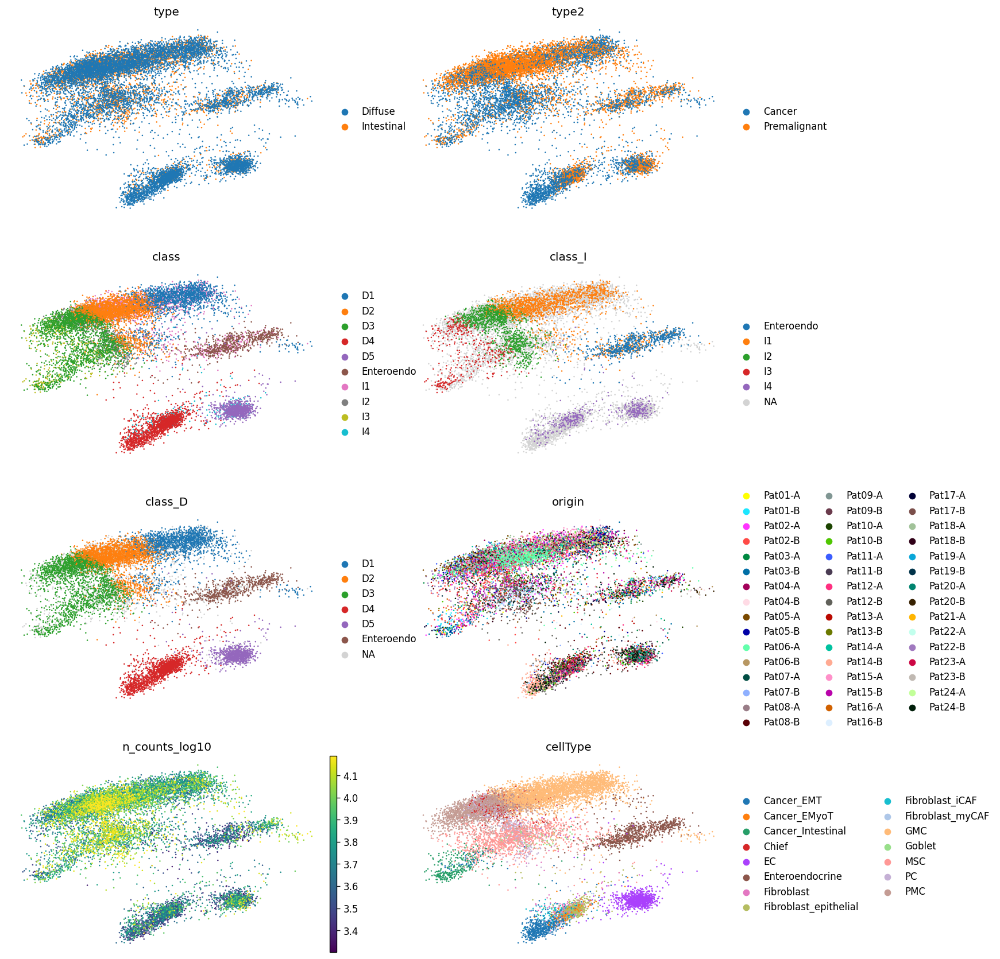

[Epoch 0011]  Loss: 64660627.62864
[Epoch 0012]  Loss: 64736911.86506
[Epoch 0013]  Loss: 64440828.21158
[Epoch 0014]  Loss: 64349640.99114
[Epoch 0015]  Loss: 64268699.92513


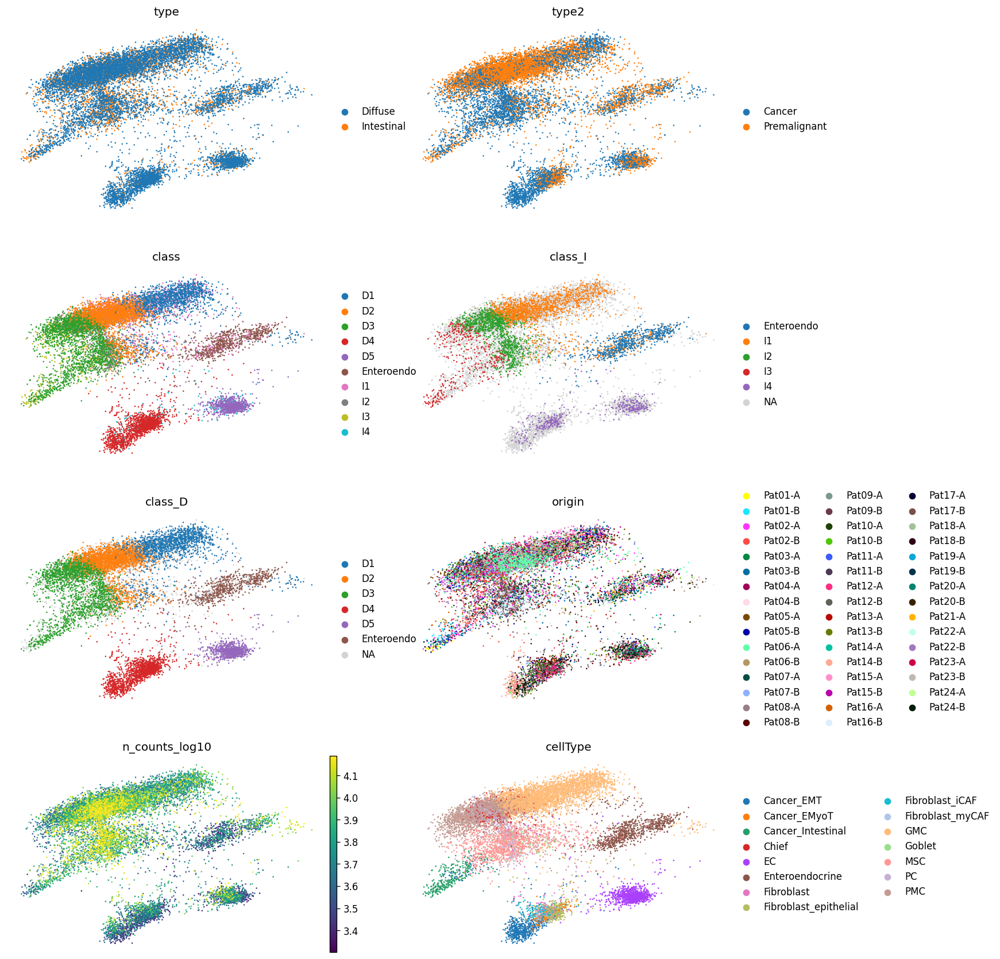

(Decipher(
   (decoder_p_to_z): ConditionalDenseNN(
     (layers): ModuleList(
       (0): Linear(in_features=2, out_features=64, bias=True)
       (1): Linear(in_features=64, out_features=20, bias=True)
     )
     (f): ReLU()
     (batch_norms): ModuleList(
       (0): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     )
   )
   (decoder_z_to_x): ConditionalDenseNN(
     (layers): ModuleList(
       (0): Linear(in_features=10, out_features=8705, bias=True)
     )
     (f): ReLU()
     (batch_norms): ModuleList()
   )
   (encoder_x_to_z): ConditionalDenseNN(
     (layers): ModuleList(
       (0): Linear(in_features=8705, out_features=128, bias=True)
       (1): Linear(in_features=128, out_features=20, bias=True)
     )
     (f): ReLU()
     (batch_norms): ModuleList(
       (0): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     )
   )
   (encoder_zx_to_p): ConditionalDenseNN(
     (layers): ModuleList(
       (0): L

In [14]:
config = DecipherConfig(
    latent_dim=10, pre_latent_dim=2, prior="normal", z_to_x_layers=[], seed=0, beta=1e-1
)
train_simple(
    adata,
    config,
    learning_rate=1e-2,
    n_epochs=16,
    batch_size=256,
    plot_every_k_epoch=5,
    plot_kwargs=dict(
        color=[
            "type",
            "type2",
            "class",
            "class_I",
            "class_D",
            "origin",
            "n_counts_log10",
            "cellType",
        ],
        vmax=lambda xs: np.quantile(xs, 0.95),
        ncols=2,
    ),
)

In [17]:
def rot(t):
    return np.array([[np.cos(t), np.sin(t)], [-np.sin(t), np.cos(t)]])

p1s = []
p2s = []
t_scores = []
for t in np.linspace(0, 2*np.pi):
    tmp = adata[adata.obs['class_D_number'].isin([1,2,3])]
    ps = tmp.obsm["decipher_v"]@rot(t)
    p1score = np.corrcoef(ps[:,0], tmp.obs['class_D_number'].values)[1,0]
    p2score = np.corrcoef(ps[:,1], tmp.obs['class_D_number'].values)[1,0]
    p1s.append(p1score)
    p2s.append(p2score)
    t_scores.append((p1score, t))
    
best_t = max(t_scores)[1]
print(best_t)

adata.obsm["decipher_v_corrected"] = adata.obsm["decipher_v"]@rot(best_t)
z_sign_correction = np.sign(
    np.corrcoef(adata.obsm["decipher_z"], y=adata.obsm["decipher_v_corrected"], rowvar=False)[
        : adata.obsm["decipher_z"].shape[1], adata.obsm["decipher_z"].shape[1] :
    ].sum(axis=1)
)

adata.obsm["decipher_z_corrected"] = adata.obsm["decipher_z"]*z_sign_correction

2.5645654315018716


In [18]:
train_simple??

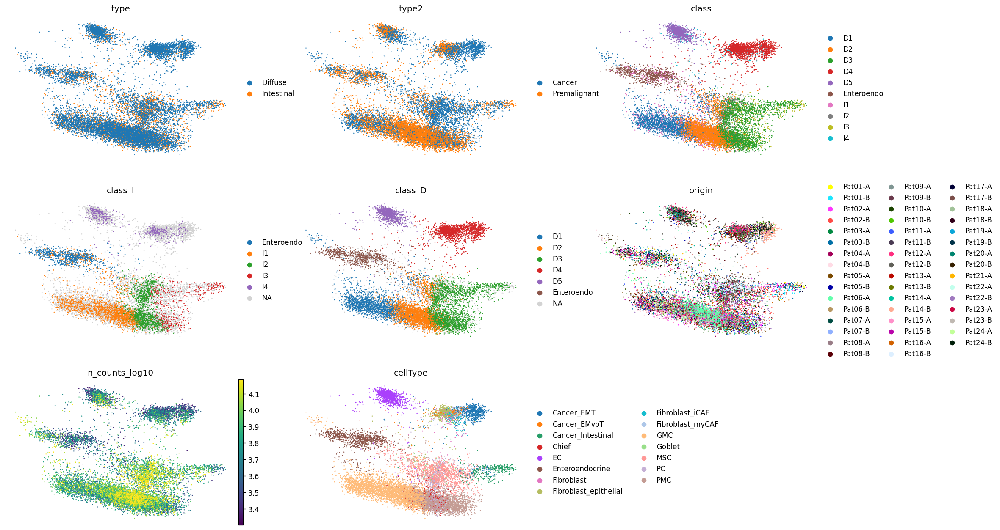

In [21]:
with plt.rc_context({"figure.figsize": (6, 4), "figure.dpi": (120)}):
    adata_log = sc.pp.log1p(adata, copy=True, base=10)
    fig = sc.pl.embedding(
        adata_log,
        basis="decipher_v_corrected",
        frameon=False,
         color=[
            "type",
            "type2",
            "class",
            "class_I",
            "class_D",
            "origin",
            "n_counts_log10",
            "cellType",
        ],
        vmax=lambda xs: np.quantile(xs, 0.95),
        ncols=3,
    )
       

In [25]:
adata.obsm

AxisArrays with keys: decipher_v, decipher_z